In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory



# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

![](http://https://www.google.com/search?q=openCV&udm=2&sxsrf=AE3TifNEXuB4uMmBa3ahIm05KY66sYtVQA%3A1764538685908#vhid=Wh-C57oTcv0RFM&vssid=mosaic)

In [2]:
import cv2 as cv 
import numpy as np
import matplotlib.pyplot as plt 

# OpenCV with image

## Read image

In [3]:
img=cv.imread("/kaggle/input/image1/yellow flower.webp")

## display BGR

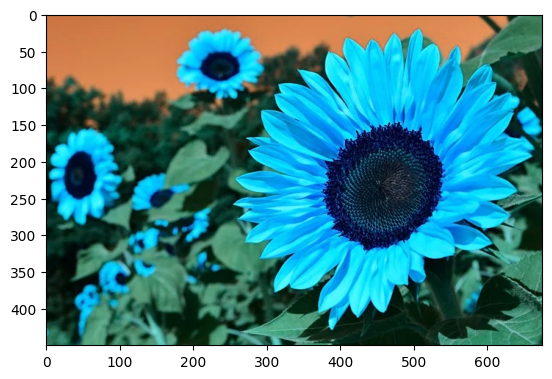

In [4]:
plt.imshow(img)



## display RGB

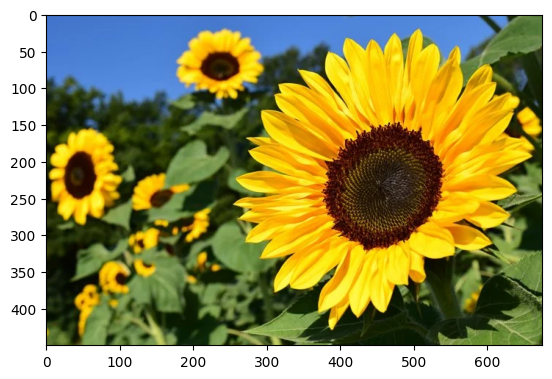

In [5]:
img_rgb=cv.cvtColor(img,cv.COLOR_BGR2RGB)
plt.imshow(img_rgb)

## RGB to grayscale

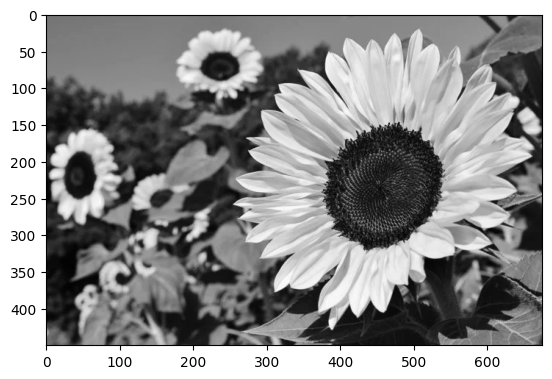

In [6]:
img_gray = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)
plt.imshow(img_gray,cmap='gray')

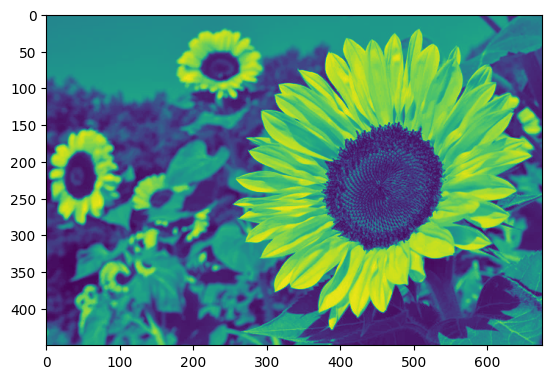

In [7]:
plt.imshow(img_gray, cmap='viridis')

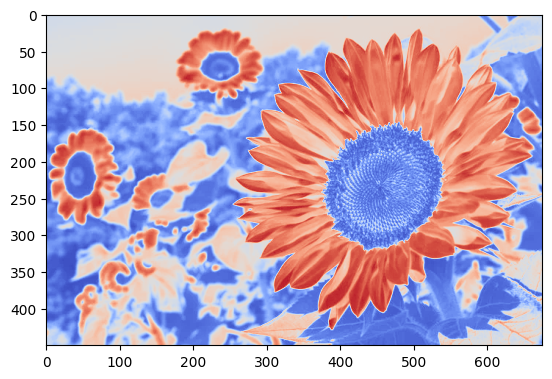

In [8]:
plt.imshow(img_gray,cmap='coolwarm')

In [9]:
img_rgb.shape

(450, 675, 3)

In [10]:
img_gray.shape

(450, 675)

## resizing

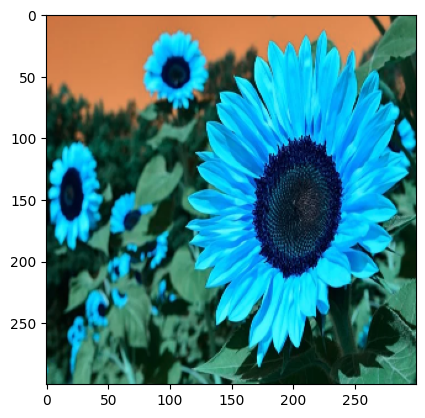

In [11]:
img=cv.resize(img,(300,300))
plt.imshow(img)

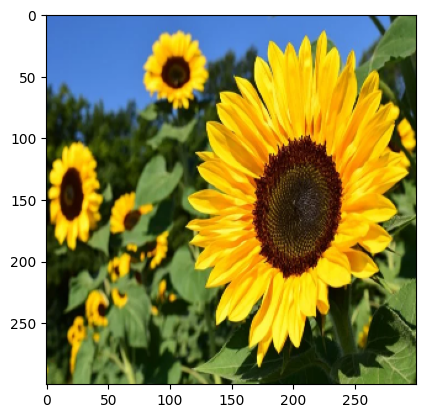

In [12]:
img_rgb=cv.cvtColor(img,cv.COLOR_BGR2RGB)
plt.imshow(img_rgb)

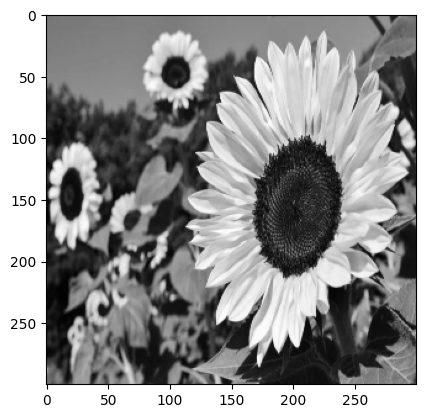

In [13]:
img_gray = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)
plt.imshow(img_gray,cmap='gray')

## Saving

In [14]:
Saved_img=cv.imwrite('gray.jpg',img_gray)

In [15]:
saved_img_PNG=cv.imwrite('gay.png',img_gray)

# Image Manipulations

## Translation

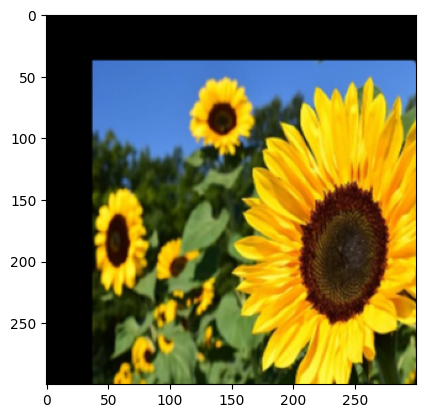

In [16]:
height , width = img_rgb.shape[:2]
Tx , Ty = height/8 , width/8

# Translation matrix is of the form -
#          |1 0 Tx|
#      T = |0 1 Ty|

T = np.float32([[1,0,Tx],
                [0,1,Ty]])
img_trans =  cv.warpAffine(img_rgb, T , (width,height))
plt.imshow(img_trans)

## Rotation

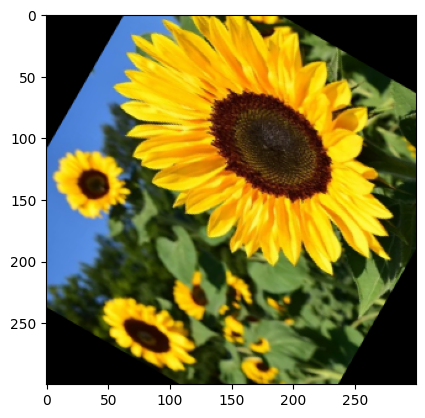

In [17]:
height , width = img_rgb.shape[:2]
rotation_matrix = cv.getRotationMatrix2D((width/2,height/2), 60, 1)
img_rotated =  cv.warpAffine(img_rgb, rotation_matrix , (width,height))
plt.imshow(img_rotated)

## Smoothing

### What is smoothing?

* Smoothing (or blurring) is a process to reduce noise and detail in an image.

* It works by averaging pixel values with their neighbors.

* Smoothing is often used as a preprocessing step in tasks like edge detection or object recognition.


### Averaging (Mean Filter)Each pixel is replaced by the average of its neighbors.Formula (for a 3×3 kernel):


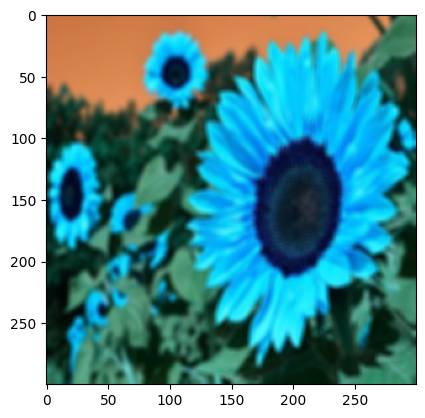

In [18]:
img_blur=cv.blur(img,(5,5))
plt.imshow(img_blur)

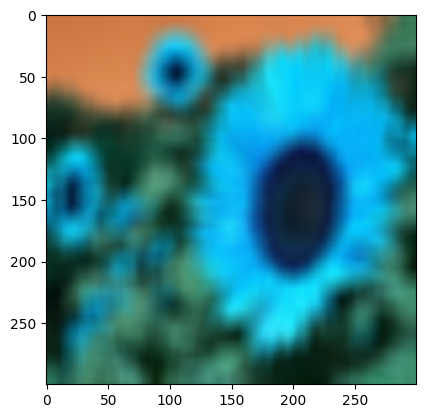

In [19]:
img_blur=cv.blur(img,(20,20))
plt.imshow(img_blur)

> The larger the kernal the more blur 


### Gaussian SmoothingUses a Gaussian-weighted average (closer pixels count more).Formula for 2D Gaussian kernel:


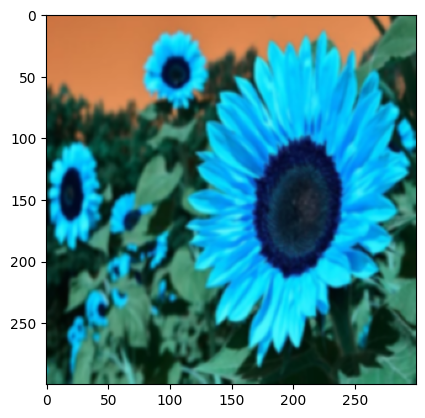

In [20]:
img_gauss = cv.GaussianBlur(img, (5,5), sigmaX=0)
plt.imshow(img_gauss)


### Median FilterEach pixel is replaced by the median value of its neighbors.Very effective for salt-and-pepper noise.Effect:Preserves edges better than averaging, removes outliers.


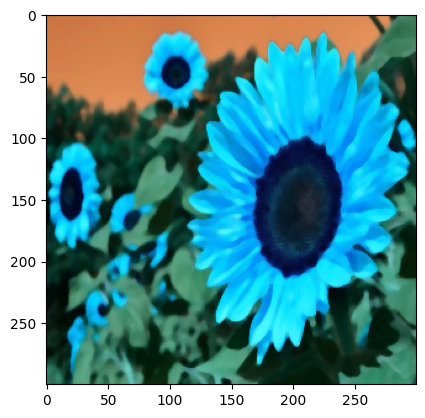

In [21]:
img_median = cv.medianBlur(img, 5) #kernal size must be odd
plt.imshow(img_median)


### Bilateral FilterSmooths the image while keeping edges sharp.Works by combining spatial distance and intensity difference.Effect:Great for noise reduction without blurring edges.


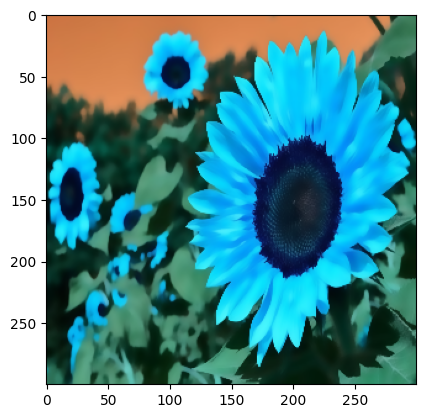

In [22]:
img_bilateral = cv.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)
plt.imshow(img_bilateral)

## Edge Detection

**What is Edge Detection?**

* Edges are places in an image where the intensity changes sharply (e.g., object boundaries).

* Detecting edges is fundamental for object detection, segmentation, and feature extraction.

> * Why edges matter:

1. Highlight shapes and boundaries.

2. Reduce data while keeping important structural information.

3. Preprocessing for computer vision tasks.


**Basic Idea**

Edge detection involves calculating the gradient of pixel intensity:

* Gradient = rate of change of intensity.

* High gradient → likely an edge.

### Gradient-Based Methods

These use derivatives to find edges.

#### Sobel Operator

Computes gradient in x and y directions.

Gy , Gx

G=sqrt(Gx2​+Gy2​)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


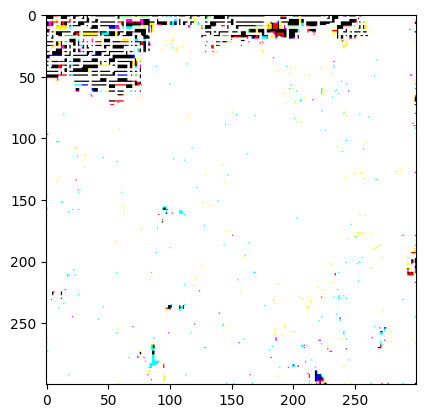

In [23]:
sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)  # x-gradient
sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)  # y-gradient
sobel = cv.magnitude(sobelx, sobely)
plt.imshow(sobel)


#### Scharr OperatorLike Sobel but more accurate for small kernels.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


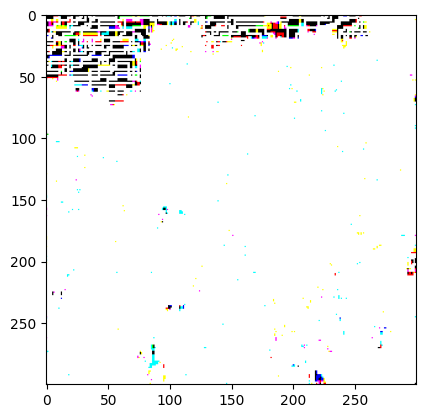

In [24]:
scharrx = cv.Scharr(img, cv.CV_64F, 1, 0)
scharry = cv.Scharr(img, cv.CV_64F, 0, 1)
scharr= cv.magnitude(scharrx,scharry)
plt.imshow(scharr)


#### Laplacian OperatorComputes second derivative of image.Detects edges regardless of direction.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


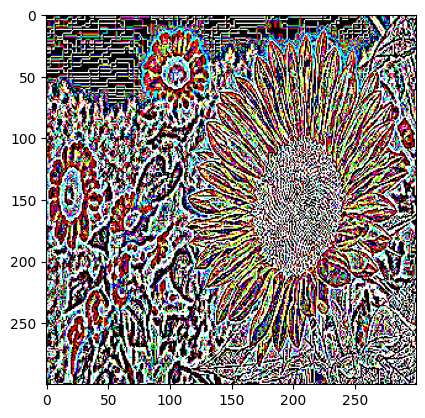

In [25]:
laplacian = cv.Laplacian(img, cv.CV_64F)
plt.imshow(laplacian)

#### Canny Edge Detector

One of the most popular edge detectors.

**Multi-step process:**

* Noise reduction (Gaussian blur).

* Gradient calculation (Sobel).

* Non-maximum suppression (thin edges).

* Double threshold (strong vs. weak edges).

* Edge tracking by hysteresis.

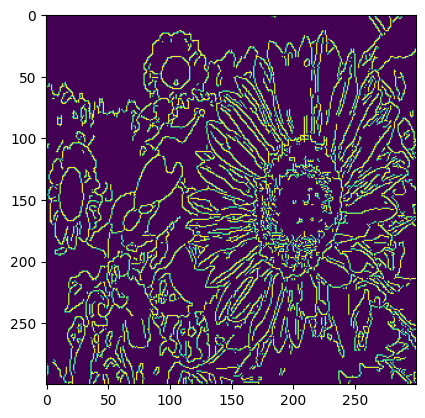

In [26]:
edges = cv.Canny(img, 100, 200)  # 100=lower threshold, 200=upper
plt.imshow(edges)

## thresholding

**What is Image Thresholding?**


> Thresholding is a technique to convert a grayscale image into a binary image.Pixels are classified as foreground or background based on a threshold value.


**Example**
* If threshold = 127, all pixels > 127 → 255 (white)

* All pixels ≤ 127 → 0 (black)

> * cv.THRESH_BINARY_INV → inverted binary

> * cv.THRESH_TRUNC → pixel values above threshold set to threshold

> * cv.THRESH_TOZERO → pixel values below threshold set to 0

> * cv.THRESH_TOZERO_INV → inverted version


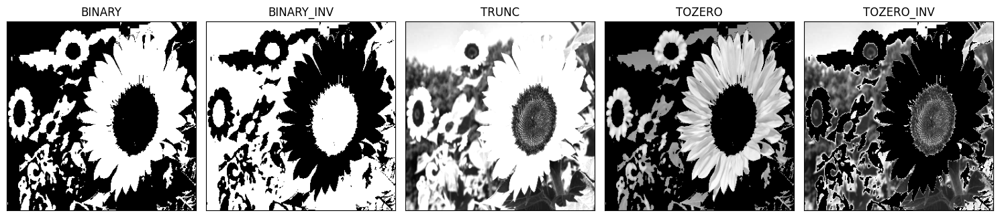

In [27]:
threshold_types = {
    "BINARY": cv.THRESH_BINARY,
    "BINARY_INV": cv.THRESH_BINARY_INV,
    "TRUNC": cv.THRESH_TRUNC,
    "TOZERO": cv.THRESH_TOZERO,
    "TOZERO_INV": cv.THRESH_TOZERO_INV
}

thresh_value = 127
max_value = 255

# Create lists for images and titles
images = []
titles = []

for name, t_type in threshold_types.items():
    ret, thresh_img = cv.threshold(img_gray, thresh_value, max_value, t_type)
    images.append(thresh_img)
    titles.append(name)

# Plot all thresholded images
plt.figure(figsize=(15,5))
for i in range(len(images)):
    plt.subplot(1,5,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.tight_layout()
plt.show()

# Features Extraction

**What are Image Features?**

Features are distinctive attributes of an image that help in understanding or describing it.

They can be:

* Points (keypoints) → corners, blobs, interest points

* Edges → boundaries of objects

* Regions/Contours → shapes or connected areas

* Texture → patterns, gradients, local intensity changes

**Purpose: Features are used for:**

* Object detection and recognition

* Image matching and stitching

* Tracking and motion detection

* Classification and segmentation

**Point Features (Keypoints)**

Specific points in an image that are stable and distinctive.

**Examples: corners, blobs, or special interest points.**

* i) Harris Corner Detection

Detects corners where intensity changes sharply in multiple directions.

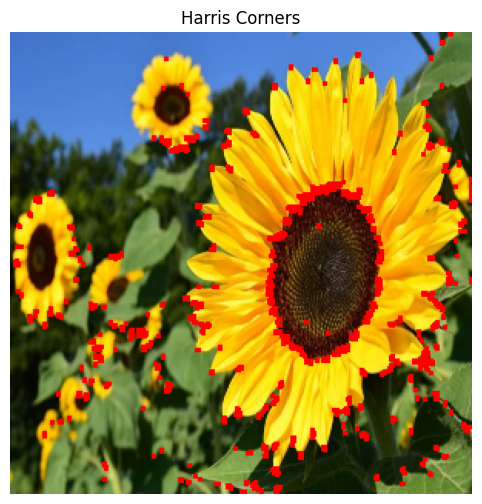

In [28]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt


img_copy = img.copy()  # keep original

# Convert to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Convert to float32 for Harris corner detection
gray = np.float32(gray)

# Detect corners
dst = cv.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# Dilate to mark the corners
dst = cv.dilate(dst, None)

# Threshold to mark the corners in red on original image
img_copy[dst > 0.01 * dst.max()] = [0, 0, 255]

# Convert BGR to RGB for Matplotlib
img_rgb = cv.cvtColor(img_copy, cv.COLOR_BGR2RGB)

# Display the result
plt.figure(figsize=(8,6))
plt.imshow(img_rgb)
plt.title("Harris Corners")
plt.axis('off')
plt.show()


**Blob Features**

* Regions in the image that differ from surrounding pixels.

* Detected using methods like Laplacian of Gaussian (LoG), DoG (Difference of Gaussian), or MSER.

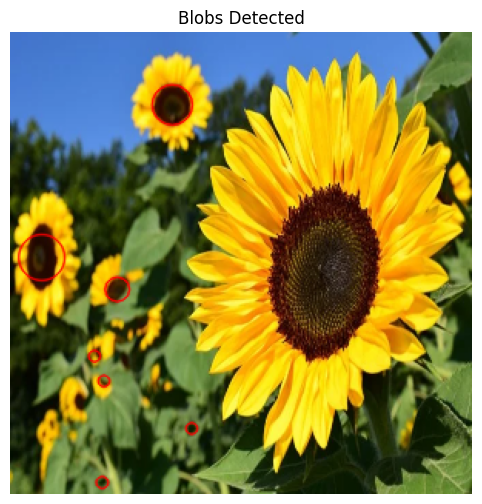

In [29]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Create SimpleBlobDetector
detector = cv.SimpleBlobDetector_create()

# Detect blobs
keypoints = detector.detect(gray)

# Draw blobs on the original image
img_with_blobs = cv.drawKeypoints(img, keypoints, None, (0,0,255),
                                  cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Convert BGR to RGB for matplotlib display
img_rgb = cv.cvtColor(img_with_blobs, cv.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(8,6))
plt.imshow(img_rgb)
plt.title("Blobs Detected")
plt.axis('off')
plt.show()

**Contours / Shapes**

1. Contours are curves joining all points of the same intensity.

* Useful for object detection, segmentation, shape analysis.

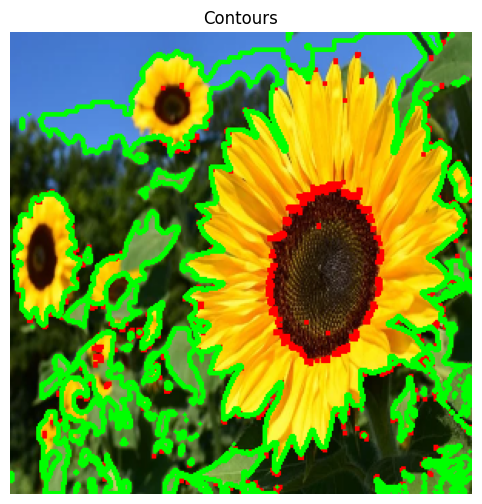

In [30]:
ret, thresh = cv.threshold(gray, 127, 255, cv.THRESH_BINARY)

# Find contours
contours, hierarchy = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
cv.drawContours(img_copy, contours, -1, (0,255,0), 2)  # green contours

# Convert BGR to RGB for matplotlib
img_rgb = cv.cvtColor(img_copy, cv.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(8,6))
plt.imshow(img_rgb)
plt.title("Contours")
plt.axis('off')
plt.show()

**Feature Descriptors**

After detecting keypoints, we compute descriptors → vectors representing the local region around the keypoint.

**Examples:**

* SIFT (Scale-Invariant Feature Transform) → detects and describes keypoints, robust to scale and rotation

* SURF (Speeded-Up Robust Features) → faster than SIFT

* ORB (Oriented FAST and Rotated BRIEF) → fast and free to use

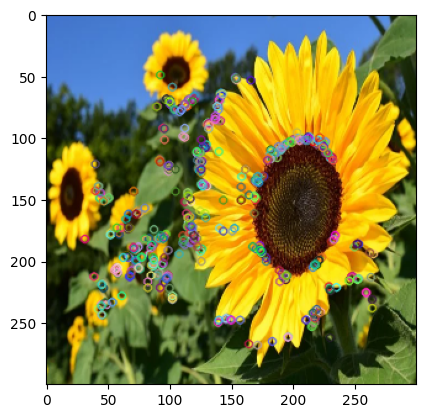

In [31]:
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
# Initiate STAR detector feature detection algorithm.
orb = cv.ORB_create() 

#find the keypoints (Points of interest in the image.) and compute the descriptors (Numeric representation) with ORB
kp, des = orb.detectAndCompute(img,None)

# draw keypoints location
img2 = cv.drawKeypoints(img, kp,None)

plt.imshow(img2)

# Image Enhancement

**What is Image Enhancement?**

* Image enhancement improves the visual quality of an image for human viewing or further computer vision tasks.

* Enhancement techniques adjust intensity, contrast, or details to make features more visible.


## Brightness

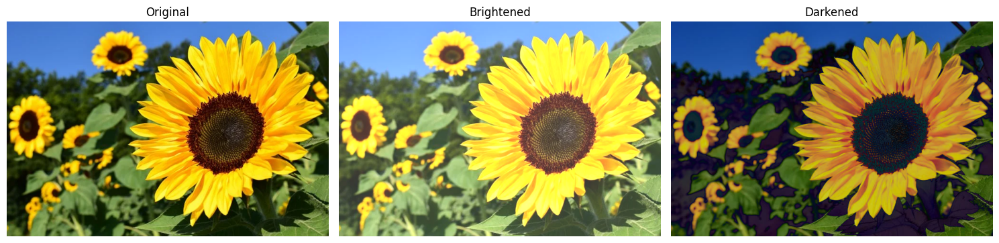

In [32]:
import cv2 as cv
from matplotlib import pyplot as plt

# Read image
img = cv.imread("/kaggle/input/image1/yellow flower.webp")

# Convert BGR to RGB for Matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Adjust brightness
bright = cv.convertScaleAbs(img, alpha=1, beta=50)  # increase brightness
dark = cv.convertScaleAbs(img, alpha=1, beta=-50)   # decrease brightness

# Convert bright/dark images to RGB for Matplotlib
bright_rgb = cv.cvtColor(bright, cv.COLOR_BGR2RGB)
dark_rgb = cv.cvtColor(dark, cv.COLOR_BGR2RGB)

# Display images side by side
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(bright_rgb)
plt.title("Brightened")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(dark_rgb)
plt.title("Darkened")
plt.axis('off')

plt.tight_layout()
plt.show()


## Contrast Adjustment

**Contrast is the difference between light and dark areas.**

* High contrast → details stand out more

* Low contrast → image looks flat

**How to adjust contrast**

Multiply pixel values by a factor alpha **(>1 increases contrast, <1 decreases contrast)**:

> Linear

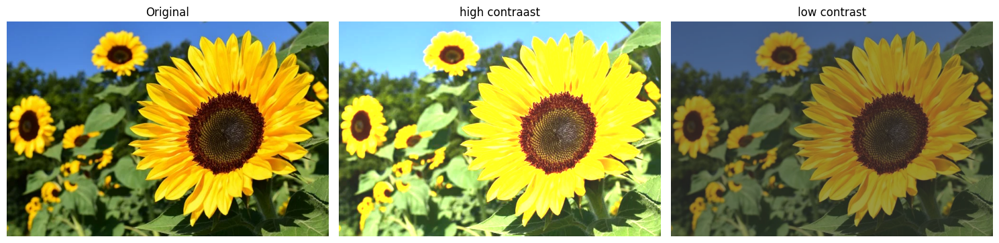

In [33]:
high_contrast = cv.convertScaleAbs(img, alpha=1.5, beta=30)  # increase contrast
low_contrast = cv.convertScaleAbs(img, alpha=0.5, beta=30)   # decrease contrast
#alpha 1.0-3.0
#beta 0-100
high_contrast_rgb = cv.cvtColor(high_contrast, cv.COLOR_BGR2RGB)
low_contrast_rgb = cv.cvtColor(low_contrast, cv.COLOR_BGR2RGB)

# Display images side by side
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(high_contrast_rgb)
plt.title("high contraast")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(low_contrast_rgb)
plt.title("low contrast")
plt.axis('off')

plt.tight_layout()
plt.show()


> Gamma

(-0.5, 674.5, 449.5, -0.5)

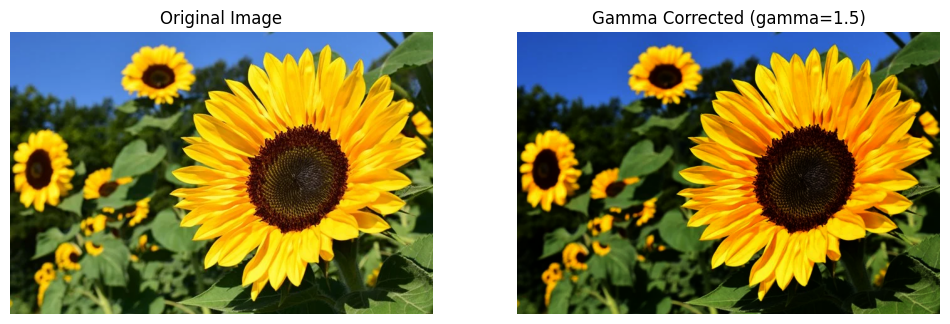

In [34]:
gamma = 1.5  # Try <1 for brighter, >1 for darker
gamma_corrected = np.array(255 * (img_rgb / 255) ** gamma, dtype='uint8')

# Display original and gamma corrected

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(gamma_corrected)
plt.title(f"Gamma Corrected (gamma={gamma})")
plt.axis('off')

## Equalization

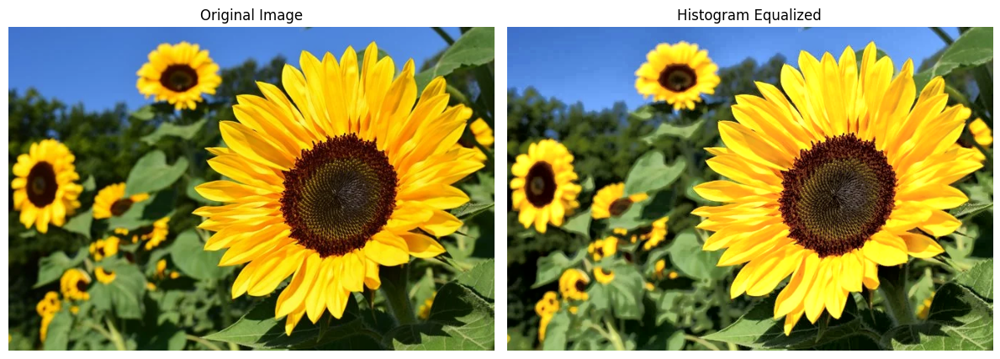

In [35]:
img_ycrcb = cv.cvtColor(img, cv.COLOR_BGR2YCrCb)
img_ycrcb[:, :, 0] = cv.equalizeHist(img_ycrcb[:, :, 0])  # equalize Y channel
hist_eq = cv.cvtColor(img_ycrcb, cv.COLOR_YCrCb2BGR)
hist_eq_rgb = cv.cvtColor(hist_eq, cv.COLOR_BGR2RGB)

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(hist_eq_rgb)
plt.title("Histogram Equalized")
plt.axis('off')

plt.tight_layout()
plt.show()

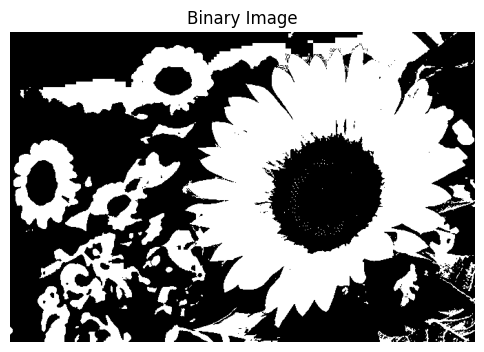

In [36]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Read image and convert to grayscale
img = cv.imread("/kaggle/input/image1/yellow flower.webp")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Threshold to create a binary image (required for morphology)
ret, binary = cv.threshold(gray, 127, 255, cv.THRESH_BINARY)

plt.figure(figsize=(6,6))
plt.imshow(binary, cmap='gray')
plt.title("Binary Image")
plt.axis('off')
plt.show()


# Morphological Image Processing

**Morphological operations are applied on binary or grayscale images to modify shapes (typically on foreground objects)**

## Erosion

Explanation:

* Erosion shrinks bright areas (foreground pixels) in the image.

* Removes small noise and makes objects thinner.

* Uses a structuring element (kernel).

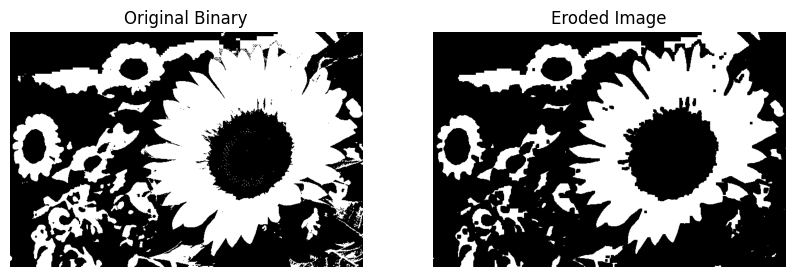

In [37]:
# Define kernel
kernel = np.ones((5,5), np.uint8)

# Erosion
erosion = cv.erode(binary, kernel, iterations=1)

# Display
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(binary, cmap='gray')
plt.title("Original Binary")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(erosion, cmap='gray')
plt.title("Eroded Image")
plt.axis('off')
plt.show()


# Dilation

Explanation:

* Dilation expands bright areas (foreground pixels).

* Fills small holes and makes objects thicker.

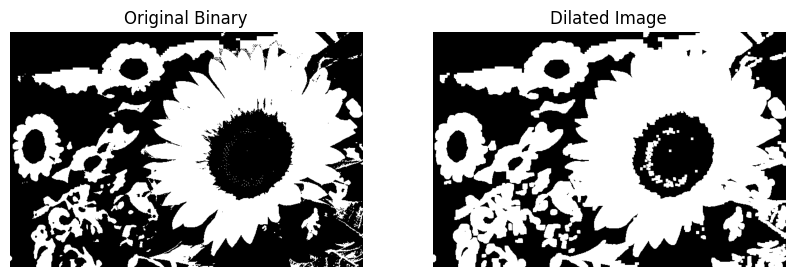

In [38]:
# Dilation
dilation = cv.dilate(binary, kernel, iterations=1)

# Display
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(binary, cmap='gray')
plt.title("Original Binary")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(dilation, cmap='gray')
plt.title("Dilated Image")
plt.axis('off')
plt.show()


# Opening (Erosion followed by Dilation)

Explanation:

**Removes small noise while preserving object shape.**

* Erosion → removes small noise

* Dilation → restores object size

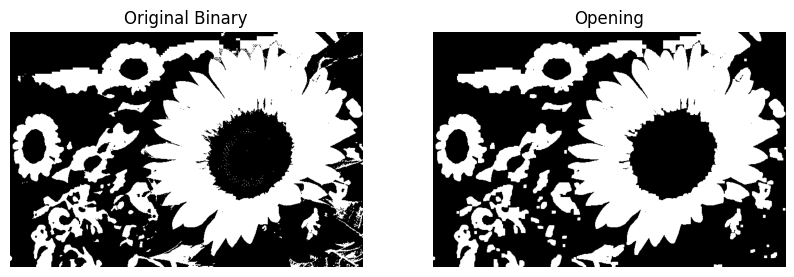

In [39]:
# Opening
opening = cv.morphologyEx(binary, cv.MORPH_OPEN, kernel)

# Display
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(binary, cmap='gray')
plt.title("Original Binary")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(opening, cmap='gray')
plt.title("Opening")
plt.axis('off')
plt.show()


# Closing (Dilation followed by Erosion)

Explanation:

**Fills small holes inside objects.**

* Dilation → fills holes

* Erosion → restores object size

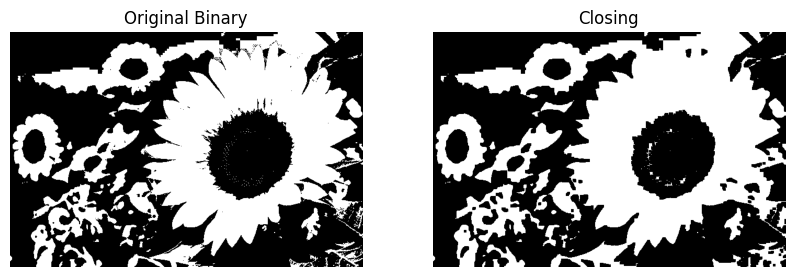

In [40]:
# Closing
closing = cv.morphologyEx(binary, cv.MORPH_CLOSE, kernel)

# Display
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(binary, cmap='gray')
plt.title("Original Binary")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(closing, cmap='gray')
plt.title("Closing")
plt.axis('off')
plt.show()


## Log Transformation

Formula:
s=c⋅log(1+r)

r → input pixel value (0–255 normalized to 0–1 or 0–255)

s → output pixel value

c → scaling constant

**Effect:**

* Enhances dark pixels

* Compresses high intensity values

* Good for images with large dynamic range

## Inverse Log Transformation

Formula:


s=c⋅((e^r)−1)

**Effect:**

* Expands dark pixels

* Can lighten dark regions significantly

* Can increase the dynamic range for low intensity pixels

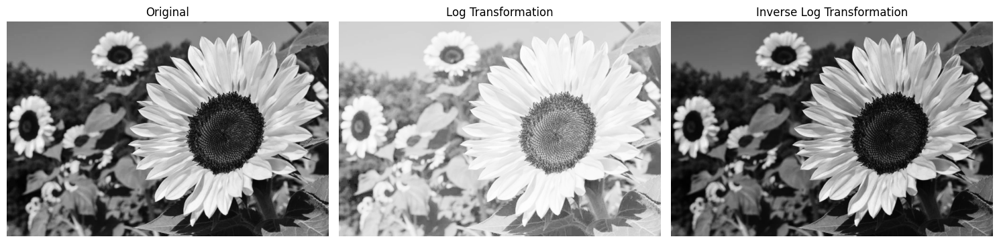

In [41]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Read image in grayscale
img = cv.imread("/kaggle/input/image1/yellow flower.webp", 0)

# Convert to float32
img_float = img.astype(np.float32)

# -----------------------
# Log Transformation
# -----------------------
c = 255 / np.log(1 + np.max(img_float))  # scaling constant
log_transformed = c * np.log(1 + img_float)
log_transformed = np.array(log_transformed, dtype=np.uint8)

# -----------------------
# Inverse Log Transformation
# -----------------------
# First normalize to 0–1
img_norm = img_float / 255.0
inverse_log = np.exp(img_norm) - 1
inverse_log = 255 * inverse_log / np.max(inverse_log)  # scale back to 0-255
inverse_log = np.array(inverse_log, dtype=np.uint8)

# -----------------------
# Display
# -----------------------
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(log_transformed, cmap='gray')
plt.title("Log Transformation")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(inverse_log, cmap='gray')
plt.title("Inverse Log Transformation")
plt.axis('off')

plt.tight_layout()
plt.show()


# Applications of Computer Vision using OpenCV

| Application              | Method                                     | Use Case                                    |
| ------------------------ | ------------------------------------------ | ------------------------------------------- |
| Face/Eye Detection       | Haar Cascade                               | Face recognition, surveillance              |
| Object Detection         | Haar, HOG, YOLO                            | Security, traffic analysis                  |
| Motion Detection         | Frame differencing, background subtraction | Intrusion detection                         |
| Image Segmentation       | Thresholding, Contours, Watershed          | Medical imaging, AR                         |
| Feature Matching         | ORB, SIFT, SURF                            | Panorama stitching, 3D modeling             |
| Edge & Shape Detection   | Canny, Sobel, Contours                     | Industrial inspection, autonomous driving   |
| OCR                      | Preprocessing + Tesseract                  | Document digitization, number plate reading |
| Hand Gesture Recognition | Skin + Contours + Convexity defects        | HCI, sign language                          |


## Face/Eye Detection (Haar Cascade)

**Concept**

* A Haar Cascade Classifier is a machine learning-based object detection method.

* It uses features called Haar-like features and a cascade of classifiers to detect objects.

* In OpenCV, pre-trained Haar classifiers are available for faces, eyes, smiles, full body, etc.

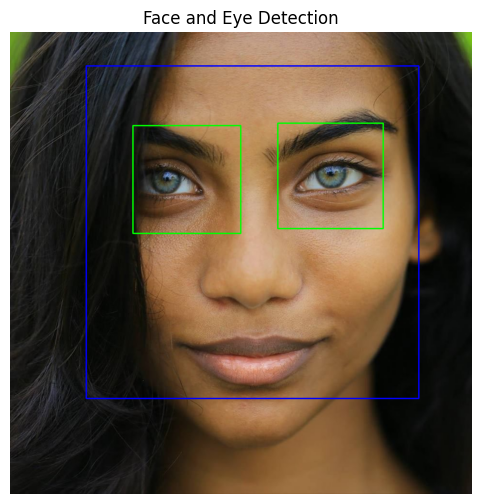

In [42]:

# Load image and convert to grayscale
img = cv.imread("/kaggle/input/face-img/face.jpg")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Load Haar cascades
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_frontalface_default.xml")
eye_cascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_eye.xml")

# Detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
for (x, y, w, h) in faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (255,0,0), 2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0,255,0), 2)

# Convert BGR to RGB for Matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Display using Matplotlib
plt.figure(figsize=(8,6))
plt.imshow(img_rgb)
plt.title("Face and Eye Detection")
plt.axis('off')
plt.show()


## Object Detection (HOG + SVM for pedestrian)

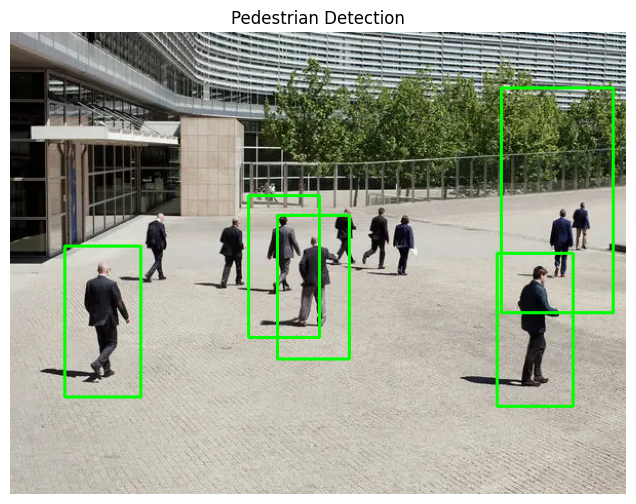

In [43]:
import cv2 as cv
from matplotlib import pyplot as plt

# Load image
img = cv.imread("/kaggle/input/people/people.webp")

# HOG descriptor for pedestrian detection
hog = cv.HOGDescriptor()
hog.setSVMDetector(cv.HOGDescriptor_getDefaultPeopleDetector())

# Detect pedestrians
(rects, weights) = hog.detectMultiScale(img, winStride=(8,8))
for (x, y, w, h) in rects:
    cv.rectangle(img, (x, y), (x+w, y+h), (0,255,0), 2)

# Convert to RGB and display
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(10,6))
plt.imshow(img_rgb)
plt.title("Pedestrian Detection")
plt.axis('off')
plt.show()


## Motion Detection (Frame Differencing)

* **Detect moving objects using frame differencing, background subtraction.**

* **Applications: Surveillance, tracking, anomaly detection.**

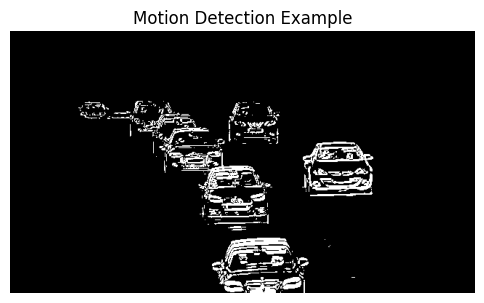

In [44]:


cap = cv.VideoCapture("/kaggle/input/cars-vid/cars.mp4")

ret, frame1 = cap.read()
prev_gray = cv.cvtColor(frame1, cv.COLOR_BGR2GRAY)
motion_frames = []

while True:
    ret, frame2 = cap.read()
    if not ret:
        break
    gray = cv.cvtColor(frame2, cv.COLOR_BGR2GRAY)
    diff = cv.absdiff(prev_gray, gray)
    _, thresh = cv.threshold(diff, 25, 255, cv.THRESH_BINARY)
    motion_frames.append(thresh)
    prev_gray = gray

cap.release()

# Display first motion frame
plt.figure(figsize=(6,6))
plt.imshow(motion_frames[0], cmap='gray')
plt.title("Motion Detection Example")
plt.axis('off')
plt.show()


## Image Segmentation (Contours)

* **Separate objects from the background.**

* **Methods: Thresholding, Contours, Watershed, GrabCut.**

* **Applications: Medical imaging (tumor detection), autonomous driving.**

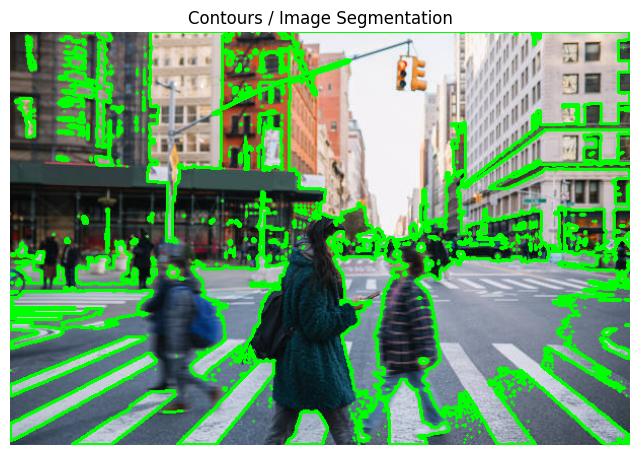

In [45]:
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread("/kaggle/input/street/Street.jpg")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
_, thresh = cv.threshold(gray, 127, 255, cv.THRESH_BINARY)

# Find contours and draw
contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(img, contours, -1, (0,255,0), 2)

# Convert to RGB and display
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(8,6))
plt.imshow(img_rgb)
plt.title("Contours / Image Segmentation")
plt.axis('off')
plt.show()


## Feature Detection & Matching

* **Detect keypoints using SIFT, SURF, ORB, or FAST.**

* **Match features between images.**

* **Applications: Panorama stitching, 3D reconstruction, augmented reality.**

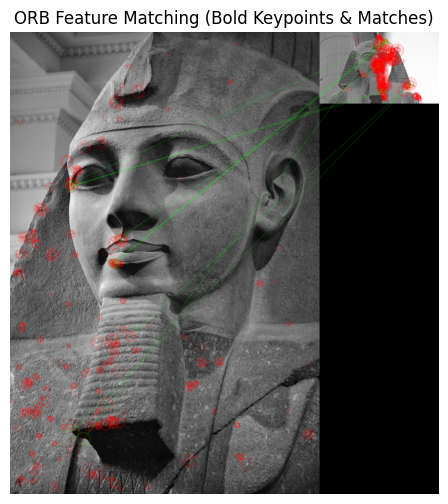

In [46]:
import cv2 as cv
from matplotlib import pyplot as plt

img1 = cv.imread("/kaggle/input/ramsis2/Ramsis angle 2.jpg", 0)
img2 = cv.imread("/kaggle/input/ramsissss/Ramsis angle1.jpg", 0)

orb = cv.ORB_create()
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Brute Force Matcher
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draw top 10 matches with bold colors
img_matches = cv.drawMatches(
    img1, kp1, img2, kp2, matches[:10], None,
    matchColor=(0, 255, 0),  # green lines for matches
    singlePointColor=(255, 0, 0),  # red keypoints
    flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

# Display with Matplotlib
plt.figure(figsize=(12,6))
plt.imshow(img_matches)
plt.title("ORB Feature Matching (Bold Keypoints & Matches)")
plt.axis('off')
plt.show()


## Edge & Shape Detection (Canny + Contours)

* Detect edges using Canny, Sobel, Laplacian.

* Detect contours and shapes.

* Applications: Industrial inspection, lane detection in autonomous vehicles.

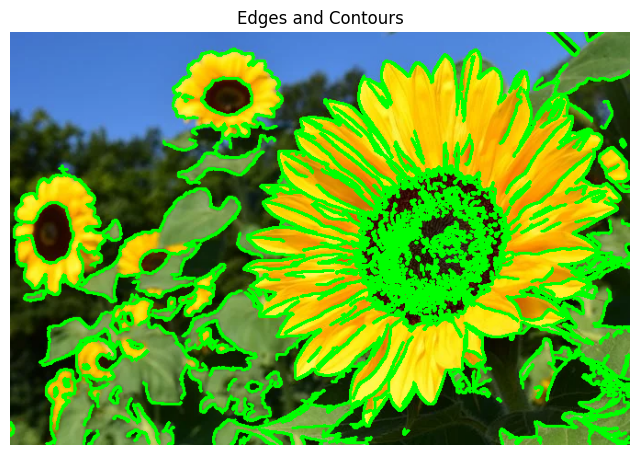

In [47]:
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread("/kaggle/input/image1/yellow flower.webp")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray, 100, 200)

# Find contours on edges
contours, _ = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(img, contours, -1, (0,255,0), 2)

img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(8,6))
plt.imshow(img_rgb)
plt.title("Edges and Contours")
plt.axis('off')
plt.show()


## Optical Character Recognition (OCR)

* Preprocess images using OpenCV for text extraction.

* Pass processed image to Tesseract OCR or other libraries.

* Applications: Document scanning, number plate recognition.

DETECTED RECEIPT TEXT:
NN Nt ee Neem |
CASH RECELPT
Adrese: 1234 Loron Ipsun, Dolor

Tols 123-456-7890
Bate: 01-01-2018 10:35 ~
Lorom 6.50
Tpaum 7.50
Dolor Sit 48.00
Anot 9.30
‘Connaccatur 11.90
Adlpdueing Elic 1,20
Sad No 0.40
Total 84 .80
Sub-total 76.80
Salou Tax 8.00
Balance 84.80
THANK YOU



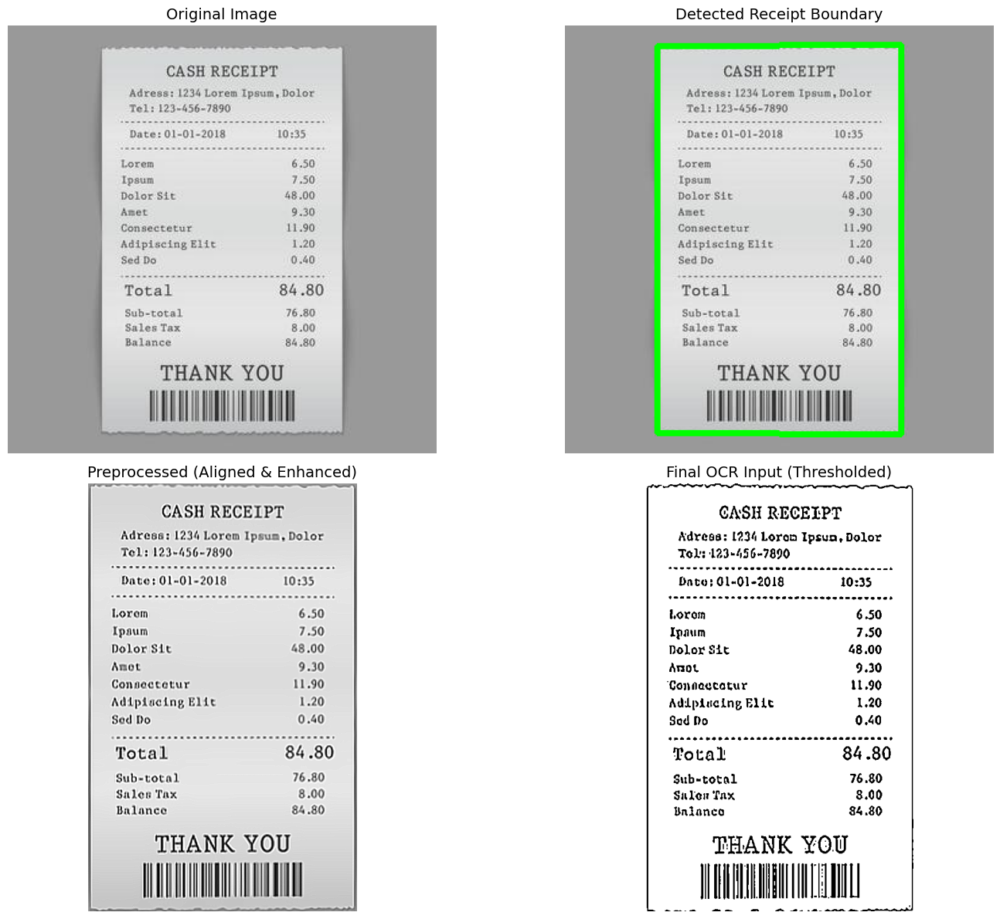

In [48]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import pytesseract

# Read image
img = cv.imread("/kaggle/input/reciept/reciept.jpg")
original = img.copy()

# Convert to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 1. DETECT AND ALIGN RECEIPT
# Edge detection to find receipt boundaries
edges = cv.Canny(gray, 50, 150, apertureSize=3)
kernel = np.ones((5,5), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)

# Find contours
contours, _ = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Find the largest rectangular contour (likely the receipt)
receipt_contour = None
max_area = 0

for cnt in contours:
    area = cv.contourArea(cnt)
    if area > max_area and area > 1000:  # Minimum area threshold
        peri = cv.arcLength(cnt, True)
        approx = cv.approxPolyDP(cnt, 0.02 * peri, True)
        if len(approx) == 4:  # Rectangle
            max_area = area
            receipt_contour = approx

# If receipt detected, apply perspective transform
if receipt_contour is not None:
    # Order points: top-left, top-right, bottom-right, bottom-left
    pts = receipt_contour.reshape(4, 2)
    rect = np.zeros((4, 2), dtype="float32")
    
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    
    # Calculate dimensions
    (tl, tr, br, bl) = rect
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    # Destination points
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    # Perspective transform
    M = cv.getPerspectiveTransform(rect, dst)
    warped = cv.warpPerspective(original, M, (maxWidth, maxHeight))
    gray = cv.cvtColor(warped, cv.COLOR_BGR2GRAY)

# 2. ENHANCED PREPROCESSING
# Resize for better OCR
gray = cv.resize(gray, None, fx=2.5, fy=2.5, interpolation=cv.INTER_CUBIC)

# Denoise
gray = cv.fastNlMeansDenoising(gray, None, 10, 7, 21)

# Sharpen
kernel_sharp = np.array([[-1,-1,-1],
                         [-1, 9,-1],
                         [-1,-1,-1]])
gray = cv.filter2D(gray, -1, kernel_sharp)

# Adaptive thresholding with optimized parameters
thresh = cv.adaptiveThreshold(
    gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv.THRESH_BINARY, 15, 8
)

# Morphological operations to clean up
kernel = np.ones((2,2), np.uint8)
thresh = cv.morphologyEx(thresh, cv.MORPH_CLOSE, kernel)
thresh = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel)

# 3. OCR with custom config for better accuracy
custom_config = r'--oem 3 --psm 6'
text = pytesseract.image_to_string(thresh, config=custom_config)

print("=" * 60)
print("DETECTED RECEIPT TEXT:")
print("=" * 60)
print(text)
print("=" * 60)

# 4. VISUALIZATION
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
axes[0, 0].set_title("Original Image", fontsize=14)
axes[0, 0].axis('off')

if receipt_contour is not None:
    img_contour = original.copy()
    cv.drawContours(img_contour, [receipt_contour], -1, (0, 255, 0), 3)
    axes[0, 1].imshow(cv.cvtColor(img_contour, cv.COLOR_BGR2RGB))
    axes[0, 1].set_title("Detected Receipt Boundary", fontsize=14)
else:
    axes[0, 1].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
    axes[0, 1].set_title("No Boundary Detected", fontsize=14)
axes[0, 1].axis('off')

axes[1, 0].imshow(gray, cmap='gray')
axes[1, 0].set_title("Preprocessed (Aligned & Enhanced)", fontsize=14)
axes[1, 0].axis('off')

axes[1, 1].imshow(thresh, cmap='gray')
axes[1, 1].set_title("Final OCR Input (Thresholded)", fontsize=14)
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

## Hand Gesture Recognition

* Use skin segmentation, contour analysis, convexity defects to detect fingers.

* Applications: Human-computer interaction, gaming.

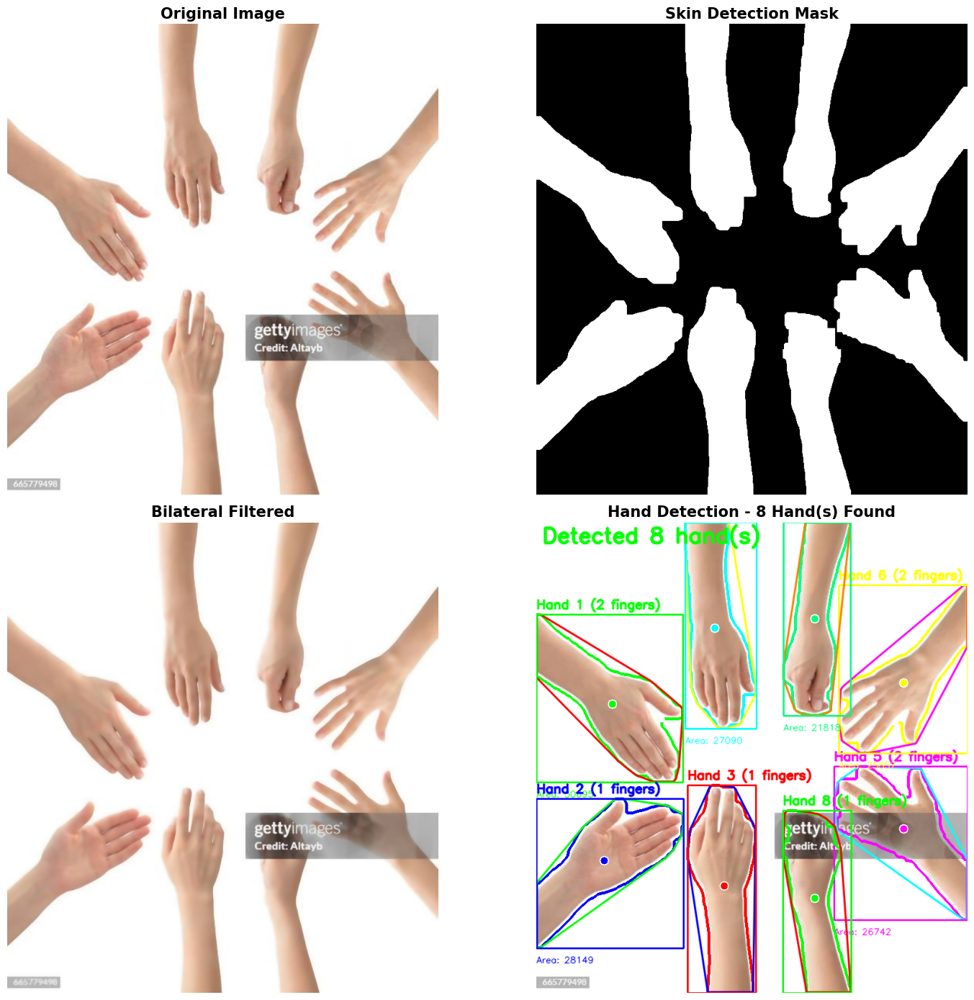

HAND DETECTION RESULTS
Total hands detected: 8
Image size: 733 x 800
Minimum detection area: 5864 pixels
Hand 1: Area = 30695 pixels
Hand 2: Area = 28149 pixels
Hand 3: Area = 27911 pixels
Hand 4: Area = 27090 pixels
Hand 5: Area = 26742 pixels
Hand 6: Area = 25857 pixels
Hand 7: Area = 21818 pixels
Hand 8: Area = 21688 pixels


In [49]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Read image
img = cv.imread("/kaggle/input/multiple-hands/handss.jpg")
original = img.copy()
h, w = img.shape[:2]

# 1. PREPROCESSING - Scale to standard size while maintaining aspect ratio
max_dim = 800
scale = min(max_dim / h, max_dim / w)
new_h, new_w = int(h * scale), int(w * scale)
img = cv.resize(img, (new_w, new_h))
original_resized = img.copy()

# Apply bilateral filter to reduce noise while keeping edges sharp
img_filtered = cv.bilateralFilter(img, 9, 75, 75)

# Convert to multiple color spaces for robust detection
hsv = cv.cvtColor(img_filtered, cv.COLOR_BGR2HSV)
ycrcb = cv.cvtColor(img_filtered, cv.COLOR_BGR2YCrCb)

# 2. MULTI-CHANNEL SKIN DETECTION
# HSV-based detection (multiple ranges for different skin tones)
hsv_masks = []

# Range 1: Light to medium skin
lower1 = np.array([0, 15, 50], dtype=np.uint8)
upper1 = np.array([25, 255, 255], dtype=np.uint8)
hsv_masks.append(cv.inRange(hsv, lower1, upper1))

# Range 2: Darker skin tones
lower2 = np.array([0, 10, 30], dtype=np.uint8)
upper2 = np.array([20, 200, 200], dtype=np.uint8)
hsv_masks.append(cv.inRange(hsv, lower2, upper2))

# YCrCb-based detection (works well in various lighting)
lower_ycrcb = np.array([0, 133, 77], dtype=np.uint8)
upper_ycrcb = np.array([255, 173, 127], dtype=np.uint8)
ycrcb_mask = cv.inRange(ycrcb, lower_ycrcb, upper_ycrcb)

# Combine all masks
mask = cv.bitwise_or(hsv_masks[0], hsv_masks[1])
mask = cv.bitwise_or(mask, ycrcb_mask)

# 3. MORPHOLOGICAL OPERATIONS - More aggressive cleaning
# Remove small noise
kernel_small = np.ones((3, 3), np.uint8)
mask = cv.morphologyEx(mask, cv.MORPH_OPEN, kernel_small, iterations=2)

# Fill holes and gaps
kernel_large = np.ones((7, 7), np.uint8)
mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel_large, iterations=3)

# Dilate to connect nearby regions
kernel_dilate = np.ones((5, 5), np.uint8)
mask = cv.dilate(mask, kernel_dilate, iterations=2)

# 4. FIND ALL HAND CONTOURS
contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Create result image
result = img.copy()
hands_detected = 0

# Filter and process each contour
min_area = (new_h * new_w) * 0.01  # Minimum 1% of image area
detected_hands = []

for cnt in contours:
    area = cv.contourArea(cnt)
    
    # Filter by area and shape
    if area < min_area:
        continue
    
    # Check if contour is hand-like (not too elongated)
    x, y, w_rect, h_rect = cv.boundingRect(cnt)
    aspect_ratio = max(w_rect, h_rect) / min(w_rect, h_rect)
    
    if aspect_ratio > 5:  # Skip very elongated shapes
        continue
    
    # Check solidity (how "filled" the shape is)
    hull = cv.convexHull(cnt)
    hull_area = cv.contourArea(hull)
    if hull_area > 0:
        solidity = area / hull_area
        if solidity < 0.3:  # Skip very sparse shapes
            continue
    
    detected_hands.append((cnt, area))

# Sort by area (largest first)
detected_hands.sort(key=lambda x: x[1], reverse=True)

# 5. DRAW DETECTIONS
for idx, (hand_contour, area) in enumerate(detected_hands):
    hands_detected += 1
    
    # Generate color for this hand
    colors = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0), 
              (255, 0, 255), (0, 255, 255), (128, 255, 0)]
    color = colors[idx % len(colors)]
    
    # Draw contour
    cv.drawContours(result, [hand_contour], -1, color, 3)
    
    # Convex hull
    hull_points = cv.convexHull(hand_contour, returnPoints=True)
    cv.drawContours(result, [hull_points], -1, 
                   (color[2], color[0], color[1]), 2, cv.LINE_AA)
    
    # Bounding rectangle
    x, y, w_rect, h_rect = cv.boundingRect(hand_contour)
    cv.rectangle(result, (x, y), (x + w_rect, y + h_rect), color, 2)
    
    # Center point
    moments = cv.moments(hand_contour)
    if moments['m00'] != 0:
        cx = int(moments['m10'] / moments['m00'])
        cy = int(moments['m01'] / moments['m00'])
        cv.circle(result, (cx, cy), 8, (255, 255, 255), -1)
        cv.circle(result, (cx, cy), 6, color, -1)
    
    # Try to detect fingers using convexity defects
    hull_indices = cv.convexHull(hand_contour, returnPoints=False)
    
    finger_count = 0
    if len(hull_indices) > 3 and len(hand_contour) > 3:
        try:
            defects = cv.convexityDefects(hand_contour, hull_indices)
            
            if defects is not None:
                for i in range(defects.shape[0]):
                    s, e, f, d = defects[i, 0]
                    start = tuple(hand_contour[s][0])
                    end = tuple(hand_contour[e][0])
                    far = tuple(hand_contour[f][0])
                    
                    # Calculate angle
                    a = np.sqrt((end[0] - start[0])**2 + (end[1] - start[1])**2)
                    b = np.sqrt((far[0] - start[0])**2 + (far[1] - start[1])**2)
                    c = np.sqrt((end[0] - far[0])**2 + (end[1] - far[1])**2)
                    
                    if b > 0 and c > 0:
                        angle = np.arccos((b**2 + c**2 - a**2) / (2 * b * c))
                        
                        # Defect must be deep enough and angle acute
                        if angle <= np.pi / 2 and d > area * 0.05:
                            finger_count += 1
                            cv.circle(result, far, 5, (255, 255, 255), -1)
                
                finger_count = min(finger_count + 1, 5)
        except:
            pass
    
    # Add label
    label = f"Hand {idx + 1}"
    if finger_count > 0:
        label += f" ({finger_count} fingers)"
    
    cv.putText(result, label, (x, y - 10), 
              cv.FONT_HERSHEY_SIMPLEX, 0.7, color, 2, cv.LINE_AA)
    cv.putText(result, f"Area: {int(area)}", (x, y + h_rect + 25),
              cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv.LINE_AA)

# Add summary text
summary = f"Detected {hands_detected} hand(s)"
cv.putText(result, summary, (10, 35), 
          cv.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3, cv.LINE_AA)

# 6. VISUALIZATION
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# Original
axes[0, 0].imshow(cv.cvtColor(original_resized, cv.COLOR_BGR2RGB))
axes[0, 0].set_title("Original Image", fontsize=15, fontweight='bold')
axes[0, 0].axis('off')

# Skin mask
axes[0, 1].imshow(mask, cmap='gray')
axes[0, 1].set_title("Skin Detection Mask", fontsize=15, fontweight='bold')
axes[0, 1].axis('off')

# Filtered
axes[1, 0].imshow(cv.cvtColor(img_filtered, cv.COLOR_BGR2RGB))
axes[1, 0].set_title("Bilateral Filtered", fontsize=15, fontweight='bold')
axes[1, 0].axis('off')

# Final result
axes[1, 1].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
axes[1, 1].set_title(f"Hand Detection - {hands_detected} Hand(s) Found", 
                     fontsize=15, fontweight='bold')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# Print detection summary
print("=" * 60)
print(f"HAND DETECTION RESULTS")
print("=" * 60)
print(f"Total hands detected: {hands_detected}")
print(f"Image size: {new_w} x {new_h}")
print(f"Minimum detection area: {int(min_area)} pixels")
for idx, (cnt, area) in enumerate(detected_hands):
    print(f"Hand {idx + 1}: Area = {int(area)} pixels")
print("=" * 60)